In [1]:
!nvidia-smi

Sun Mar 30 09:06:16 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.01             Driver Version: 535.183.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3050 ...    Off | 00000000:01:00.0 Off |                  N/A |
| N/A   56C    P8               3W /  60W |     10MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# !kill 64232

In [3]:
!pip install transformers datasets torch torchvision evaluate jiwer --break-system-packages

Defaulting to user installation because normal site-packages is not writeable
  Using cached datasets-3.4.1-py3-none-any.whl.metadata (19 kB)
  Using cached evaluate-0.4.3-py3-none-any.whl.metadata (9.2 kB)
  Using cached jiwer-3.1.0-py3-none-any.whl.metadata (2.6 kB)
  Using cached huggingface_hub-0.29.3-py3-none-any.whl.metadata (13 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 1.1 MB/s eta 0:00:004 MB/s eta 0:00:01
  Using cached tokenizers-0.21.1-cp39-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.8 kB)
  Using cached safetensors-0.5.3-cp38-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.8 kB)
  Using cached xxhash-3.5.0-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (12 kB)
  Using cached multiprocess-0.70.16-py312-none-any.whl.metadata (7.2 kB)
  Using cached click-8.1.8-py3-none-any.whl.metadata (2.3 kB)
  Using cached rapidfuzz-3.12.2-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (12 kB

In [34]:
%matplotlib inline
from IPython.display import display, clear_output

In [5]:
pip install tf-keras --break-system-packages

Defaulting to user installation because normal site-packages is not writeable
  Using cached tf_keras-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached tensorflow-2.19.0-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
  Using cached tensorboard-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached ml_dtypes-0.5.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (21 kB)
Using cached tf_keras-2.19.0-py3-none-any.whl (1.7 MB)
Using cached tensorflow-2.19.0-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (645.0 MB)
Using cached ml_dtypes-0.5.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (4.7 MB)
Using cached tensorboard-2.19.0-py3-none-any.whl (5.5 MB)
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install accelerate==0.26.0 --break-system-packages

Defaulting to user installation because normal site-packages is not writeable
  Using cached accelerate-0.26.0-py3-none-any.whl.metadata (18 kB)
Using cached accelerate-0.26.0-py3-none-any.whl (270 kB)
Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install ipywidgets --break-system-packages

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 2.0 MB/s eta 0:00:0031m2.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 3.8 MB/s eta 0:00:00m eta 0:00:010:00:01


In [1]:
import pandas as pd
import albumentations as A
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import TrOCRProcessor, VisionEncoderDecoderModel, Trainer, TrainingArguments, GenerationConfig, EarlyStoppingCallback
from PIL import Image
import numpy as np
from torch.nn.utils.rnn import pad_sequence
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
import evaluate
import os
from IPython.display import display, clear_output
os.environ["CUDA_VISIBLE_DEVICES"] = ""
torch.set_default_device("cpu")

/home/sharvesh/.local/lib/python3.12/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
2025-03-29 19:17:07.752189: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-29 19:17:07.926536: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743256028.020747    8109 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been re

In [2]:
# Load CER and WER metrics
cer_metric = evaluate.load("cer")
wer_metric = evaluate.load("wer")

# Define compute_metrics function for evaluation
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    if isinstance(logits, tuple):
        logits = logits[0]
    predictions = logits.argmax(-1)
    decoded_preds = processor.tokenizer.batch_decode(predictions, skip_special_tokens=True)
    decoded_labels = []
    for label in labels:
        label_filtered = [token for token in label if token != -100]
        decoded_label = processor.tokenizer.decode(label_filtered, skip_special_tokens=True)
        decoded_labels.append(decoded_label)
    cer_score = cer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    wer_score = wer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    return {"cer": cer_score, "wer": wer_score}

# Custom Dataset class for your line segment images and ground truth
class LineDataset(Dataset):
    def __init__(self, processor, model, line_images, texts, target_size=(256, 64), max_length=512, apply_augmentation=True):
        self.line_images = line_images  # List of PIL Images or numpy arrays
        self.texts = texts  # List of ground truth text strings
        self.processor = processor
        self.processor.image_processor.max_length = max_length
        self.processor.tokenizer.model_max_length = max_length
        self.model = model
        self.model.config.max_length = max_length
        self.target_size = target_size
        self.max_length = max_length
        self.apply_augmentation = apply_augmentation

        # Augmentations tailored to historical Spanish texts
        if apply_augmentation:
            self.transform = A.Compose([
                A.OneOf([
                    A.Rotate(limit=2, p=1.0),  # Slight rotation for realism
                    A.GaussNoise(var_limit=(5.0, 10.0), p=1.0),  # Noise for ink degradation
                    A.GaussianBlur(blur_limit=(3, 5), p=1.0),  # Faded text simulation
                    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=1.0),  # Ink fading
                    A.OpticalDistortion(distort_limit=0.02, shift_limit=0.02, p=1.0),  # Paper warping
                ], p=0.8),  # Apply augmentations with 80% probability
            ])
        else:
            self.transform = A.Compose([])

        print("Applied augmentation!")

    def __len__(self):
        return len(self.line_images)

    def __getitem__(self, idx):
        image = self.line_images[idx]
        text = self.texts[idx]

        # If image is a file path, load it; otherwise assume it’s a PIL Image or numpy array
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")
        elif isinstance(image, np.ndarray):
            image = Image.fromarray(image).convert("RGB")

        # Convert to numpy array for augmentation
        image = np.array(image)

        # Apply augmentations
        if self.apply_augmentation:
            augmented = self.transform(image=image)
            image = augmented['image']

        # Resize image to target size
        image = Image.fromarray(image).resize(self.target_size, Image.BILINEAR)
        image = np.array(image) / 255.0  # Normalize to [0, 1]
        image = np.transpose(image, (2, 0, 1))  # Convert to (C, H, W)

        # Process image and text with TrOCR processor
        encoding = self.processor(images=image, text=text, return_tensors="pt")
        encoding['labels'] = encoding['labels'][:, :self.max_length]  # Truncate if needed

        return {k: v.squeeze() for k, v in encoding.items()}

# Collate function for batching
def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    labels = pad_sequence([item['labels'] for item in batch], batch_first=True, padding_value=-100)
    return {'pixel_values': pixel_values, 'labels': labels}

# Training function
def train_transformer_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512, val_split=0.1):
    print("Inside train transformer function!")
    device = torch.device("cpu")
    global processor

    # Load TrOCR processor and model
    processor = TrOCRProcessor.from_pretrained("qantev/trocr-large-spanish", do_rescale=False)
    model = VisionEncoderDecoderModel.from_pretrained("qantev/trocr-large-spanish").to("cpu")

    # Load or define generation config
    generation_config = GenerationConfig(max_length=512, no_repeat_ngram_size=3)

    # Create dataset
    dataset = LineDataset(processor, model, line_images, texts, target_size, max_length, apply_augmentation=True)

    # Split into train and validation sets
    val_size = int(len(dataset) * val_split)
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    # Move model to device
    model = dataset.model.to(device)

    # Define training arguments
    training_args = TrainingArguments(
        output_dir="/media/sharvesh/Expansion/Documents/model/results",
        num_train_epochs=10,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        logging_dir="./logs",
        logging_steps=100,
        save_steps=100,
        save_total_limit=2,
        evaluation_strategy="steps",
        eval_steps=100,
        learning_rate=3e-5,
        weight_decay=0.01,
        load_best_model_at_end=True,
        metric_for_best_model="cer",
        greater_is_better=False,
        gradient_accumulation_steps=16,  # Adjust based on GPU memory
        fp16=True,  # Enable mixed precision training if supported
        use_cpu = True,
        logging_first_step=True
    )

    # Define optimizer and scheduler
    optimizer = AdamW(model.parameters(), lr=training_args.learning_rate, weight_decay=training_args.weight_decay)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2, verbose=True)

    # Initialize trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        data_collator=collate_fn,
        optimizers=(optimizer, scheduler),
        callbacks=[EarlyStoppingCallback(early_stopping_patience=5)],
        compute_metrics=compute_metrics
    )

    # Train the model
    trainer.train()

    # Save the fine-tuned model and processor
    model.save_pretrained("/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical")
    processor.save_pretrained("/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical")

# Load your Excel file and prepare data
excel_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"  # Update with your actual file path
df = pd.read_csv(excel_file)

# Assuming your Excel has columns 'image_path' (folder path to line segment images) and 'ground_truth' (text)
line_images = df['image_path'].tolist()  # List of file paths to line segment images
texts = df['text'].tolist()      # List of corresponding ground truth texts

# Train the model
train_transformer_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512)

Inside train transformer function!


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.50, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transf

Applied augmentation!


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/training_args.py:1611: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.


Step,Training Loss,Validation Loss,Cer,Wer
100,1.713700,1.564725,0.224238,0.512287


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/modeling_utils.py:3353: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 512, 'no_repeat_ngram_size': 3}. You are seeing this warning because you've set generation parameters in the model config, as opposed to in the generation config.
  warnings.warn(


In [ ]:
import pandas as pd
import albumentations as A
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import TrOCRProcessor, VisionEncoderDecoderModel, Trainer, TrainingArguments, GenerationConfig, EarlyStoppingCallback
from PIL import Image
import numpy as np
from torch.nn.utils.rnn import pad_sequence
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
import evaluate  # Updated for metrics

# Load CER and WER metrics
cer_metric = evaluate.load("cer")
wer_metric = evaluate.load("wer")

# Define compute_metrics function
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    if isinstance(logits, tuple):
        logits = logits[0]
    predictions = logits.argmax(-1)
    decoded_preds = processor.tokenizer.batch_decode(predictions, skip_special_tokens=True)
    decoded_labels = []
    for label in labels:
        label_filtered = [token for token in label if token != -100]
        decoded_label = processor.tokenizer.decode(label_filtered, skip_special_tokens=True)
        decoded_labels.append(decoded_label)
    cer_score = cer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    wer_score = wer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    return {"cer": cer_score, "wer": wer_score}

# Custom Dataset class (unchanged)
class LineDataset(Dataset):
    def __init__(self, processor, model, line_images, texts, target_size=(256, 64), max_length=512, apply_augmentation=True):
        self.line_images = line_images
        self.texts = texts
        self.processor = processor
        self.processor.image_processor.max_length = max_length
        self.processor.tokenizer.model_max_length = max_length
        self.model = model
        self.model.config.max_length = max_length
        self.target_size = target_size
        self.max_length = max_length
        self.apply_augmentation = apply_augmentation
        if apply_augmentation:
            self.transform = A.Compose([
                A.OneOf([
                    A.Rotate(limit=2, p=1.0),
                    A.GaussNoise(var_limit=(5.0, 10.0), p=1.0),
                    A.GaussianBlur(blur_limit=(3, 5), p=1.0),
                    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=1.0),
                    A.OpticalDistortion(distort_limit=0.02, shift_limit=0.02, p=1.0),
                ], p=0.8),
            ])
        else:
            self.transform = A.Compose([])
        print("Applied augmentation!")

    def __len__(self):
        return len(self.line_images)

    def __getitem__(self, idx):
        image = self.line_images[idx]
        text = self.texts[idx]
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")
        elif isinstance(image, np.ndarray):
            image = Image.fromarray(image).convert("RGB")
        image = np.array(image)
        if self.apply_augmentation:
            augmented = self.transform(image=image)
            image = augmented['image']
        image = Image.fromarray(image).resize(self.target_size, Image.BILINEAR)
        image = np.array(image) / 255.0
        image = np.transpose(image, (2, 0, 1))
        encoding = self.processor(images=image, text=text, return_tensors="pt")
        encoding['labels'] = encoding['labels'][:, :self.max_length]
        return {k: v.squeeze() for k, v in encoding.items()}

# Collate function
def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    labels = pad_sequence([item['labels'] for item in batch], batch_first=True, padding_value=-100)
    return {'pixel_values': pixel_values, 'labels': labels}

# Training function for the fine-tuned model
def continue_training_finetuned_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512, val_split=0.1):
    print("Inside continue training function!")
    device = torch.device("cpu")  # Adjust to "cuda" if GPU available

    # Load the fine-tuned model and processor
    global processor
    save_dir = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical"
    processor = TrOCRProcessor.from_pretrained(save_dir, do_rescale=False)
    model = VisionEncoderDecoderModel.from_pretrained(save_dir).to(device)

    # Load or define generation config
    generation_config = GenerationConfig(max_length=512, no_repeat_ngram_size=3)

    # Create dataset (use same or new data)
    dataset = LineDataset(processor, model, line_images, texts, target_size, max_length, apply_augmentation=True)
    val_size = int(len(dataset) * val_split)
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    print(f"Training dataset size: {len(train_dataset)}")
    print(f"Validation dataset size: {len(val_dataset)}")

    # Define training arguments for continued training
    training_args = TrainingArguments(
        output_dir="/media/sharvesh/Expansion/Documents/model/results_continued",  # New output dir
        num_train_epochs=10,  # Fewer epochs for additional training (adjust as needed)
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        logging_dir="./logs_continued",
        logging_steps=20,  # More frequent logging
        save_steps=100,
        save_total_limit=2,
        evaluation_strategy="steps",
        eval_steps=50,
        learning_rate=1e-5,  # Lower learning rate for fine-tuning
        weight_decay=0.01,
        load_best_model_at_end=True,
        metric_for_best_model="cer",
        greater_is_better=False,
        gradient_accumulation_steps=16,
        fp16=False,  # Set to True if using GPU with CUDA
        use_cpu=True,  # Set to False if using GPU
        logging_first_step=True,
    )

    # Define optimizer and scheduler
    optimizer = AdamW(model.parameters(), lr=training_args.learning_rate, weight_decay=training_args.weight_decay)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2, verbose=True)

    # Initialize trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        data_collator=collate_fn,
        optimizers=(optimizer, scheduler),
        callbacks=[EarlyStoppingCallback(early_stopping_patience=5)],
        compute_metrics=compute_metrics
    )

    # Continue training
    trainer.train()

    # Save the updated fine-tuned model
    updated_save_dir = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v2"
    os.makedirs(updated_save_dir, exist_ok=True)
    model.save_pretrained(updated_save_dir)
    processor.save_pretrained(updated_save_dir)
    print(f"Updated model saved to {updated_save_dir}")

# Load your CSV file and prepare data
csv_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"
df = pd.read_csv(csv_file)

# Assuming columns 'image_path' and 'text' (updated from 'ground_truth')
line_images = df['image_path'].tolist()
texts = df['text'].tolist()

# Continue training the fine-tuned model
continue_training_finetuned_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512)

In [21]:
processor = TrOCRProcessor.from_pretrained("/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v2")
model = VisionEncoderDecoderModel.from_pretrained("/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v2").to("cpu")
image = Image.open("/home/sharvesh/Documents/Others/Human_AI/Model/data/Constituciones sinodales Calahorra 1602/line_segments/0/3.jpg")
pixel_values = processor(image, return_tensors="pt").pixel_values.to("cpu")
generated_ids = model.generate(pixel_values)
text = processor.batch_decode(generated_ids, skip_special_tokens=True)['0']
print(f"Predicted text: {text}")

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

Predicted text: ['P']


Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

Applied augmentation!


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/generation/utils.py:1581: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed in v5. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(


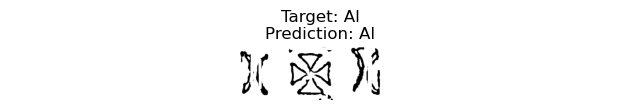

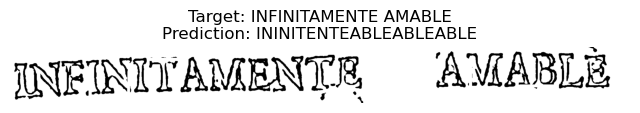

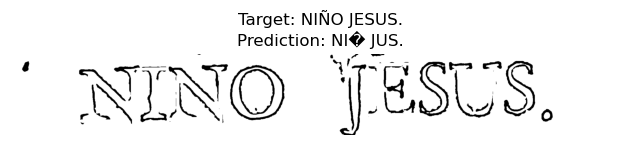

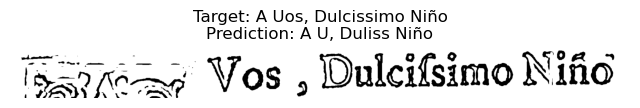

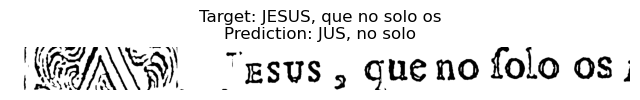

...

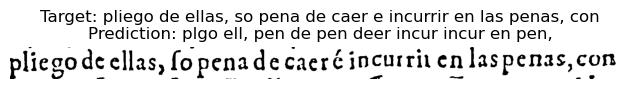

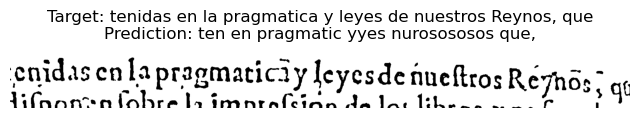

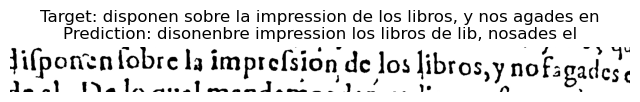

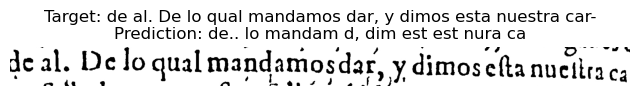

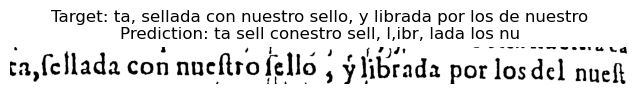

In [ ]:
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from jiwer import cer, wer
from PIL import Image
import numpy as np
import os

# Function to evaluate the trained model
def evaluate_model(line_images, texts, target_size=(256, 64), batch_size=2):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Define model and processor paths (update paths accordingly)
    model_path = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v2"
    processor_path = model_path
    
    processor = TrOCRProcessor.from_pretrained(processor_path)
    model = VisionEncoderDecoderModel.from_pretrained(model_path).to(device)
    model.eval()
    
    dataset = LineDataset(processor, model, line_images, texts, target_size, apply_augmentation=False)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
    
    cer_scores = []
    wer_scores = []
    predictions = []
    
    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            generated_ids = model.generate(pixel_values)
            generated_texts = processor.tokenizer.batch_decode(generated_ids, skip_special_tokens=True)
            
            for i, pred in enumerate(generated_texts):
                gt = texts[len(predictions)]  # Ground truth
                
                # Compute CER and WER
                cer_scores.append(cer(gt, pred))
                wer_scores.append(wer(gt, pred))
                
                predictions.append(pred)
                
                # Display image and predictions
                image_path = line_images[len(predictions) - 1]
                if isinstance(image_path, str):
                    image = Image.open(image_path).convert("L")
                else:
                    image = Image.fromarray(image_path).convert("L")
                
                plt.figure(figsize=(8, 6))
                plt.imshow(image, cmap='gray')
                plt.title(f"Target: {gt}\nPrediction: {pred}")
                plt.axis('off')
                plt.show()
                print("=" * 50)
    
    # Compute average scores
    avg_cer = sum(cer_scores) / len(cer_scores) if cer_scores else 0
    avg_wer = sum(wer_scores) / len(wer_scores) if wer_scores else 0
    
    print(f"Average CER: {avg_cer:.4f}")
    print(f"Average WER: {avg_wer:.4f}")
    print("Evaluation completed.")
    
    # Print all predictions
    for i, pred in enumerate(predictions):
        print(f"{i+1}: {pred}")

# Load your CSV file
csv_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"
df = pd.read_csv(csv_file)

line_images = df['image_path'].tolist()
texts = df['text'].tolist()

# Run evaluation
evaluate_model(line_images, texts, target_size=(256, 64), batch_size=2)

In [9]:
import pandas as pd
import albumentations as A
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import TrOCRProcessor, VisionEncoderDecoderModel, Trainer, TrainingArguments, GenerationConfig, EarlyStoppingCallback
from PIL import Image
import numpy as np
from torch.nn.utils.rnn import pad_sequence
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
import evaluate  # Updated for metrics
import os

# Load CER and WER metrics
cer_metric = evaluate.load("cer")
wer_metric = evaluate.load("wer")

# Define compute_metrics function
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    if isinstance(logits, tuple):
        logits = logits[0]
    predictions = logits.argmax(-1)
    decoded_preds = processor.tokenizer.batch_decode(predictions, skip_special_tokens=True)
    decoded_labels = []
    for label in labels:
        label_filtered = [token for token in label if token != -100]
        decoded_label = processor.tokenizer.decode(label_filtered, skip_special_tokens=True)
        decoded_labels.append(decoded_label)
    cer_score = cer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    wer_score = wer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    return {"cer": cer_score, "wer": wer_score}

# Custom Dataset class (unchanged)
class LineDataset(Dataset):
    def __init__(self, processor, model, line_images, texts, target_size=(256, 64), max_length=512, apply_augmentation=True):
        self.line_images = line_images
        self.texts = texts
        self.processor = processor
        self.processor.image_processor.max_length = max_length
        self.processor.tokenizer.model_max_length = max_length
        self.model = model
        self.model.config.max_length = max_length
        self.target_size = target_size
        self.max_length = max_length
        self.apply_augmentation = apply_augmentation
        if apply_augmentation:
            self.transform = A.Compose([
                A.OneOf([
                    A.Rotate(limit=2, p=1.0),
                    A.GaussNoise(var_limit=(5.0, 10.0), p=1.0),
                    A.GaussianBlur(blur_limit=(3, 5), p=1.0),
                    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=1.0),
                    A.OpticalDistortion(distort_limit=0.02, shift_limit=0.02, p=1.0),
                ], p=0.8),
            ])
        else:
            self.transform = A.Compose([])
        print("Applied augmentation!")

    def __len__(self):
        return len(self.line_images)

    def __getitem__(self, idx):
        image = self.line_images[idx]
        text = self.texts[idx]
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")
        elif isinstance(image, np.ndarray):
            image = Image.fromarray(image).convert("RGB")
        image = np.array(image)
        if self.apply_augmentation:
            augmented = self.transform(image=image)
            image = augmented['image']
        image = Image.fromarray(image).resize(self.target_size, Image.BILINEAR)
        image = np.array(image) / 255.0
        image = np.transpose(image, (2, 0, 1))
        encoding = self.processor(images=image, text=text, return_tensors="pt")
        encoding['labels'] = encoding['labels'][:, :self.max_length]
        return {k: v.squeeze() for k, v in encoding.items()}

# Collate function
def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    labels = pad_sequence([item['labels'] for item in batch], batch_first=True, padding_value=-100)
    return {'pixel_values': pixel_values, 'labels': labels}

# Training function for the fine-tuned model
def continue_training_finetuned_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512, val_split=0.1):
    print("Inside continue training function!")
    device = torch.device("cpu")  # Adjust to "cuda" if GPU available

    # Load the fine-tuned model and processor
    global processor
    save_dir = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v2"
    processor = TrOCRProcessor.from_pretrained(save_dir, do_rescale=False)
    model = VisionEncoderDecoderModel.from_pretrained(save_dir).to(device)

    # Load or define generation config
    generation_config = GenerationConfig(max_length=512, no_repeat_ngram_size=3)

    # Create dataset (use same or new data)
    dataset = LineDataset(processor, model, line_images, texts, target_size, max_length, apply_augmentation=True)
    val_size = int(len(dataset) * val_split)
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    print(f"Training dataset size: {len(train_dataset)}")
    print(f"Validation dataset size: {len(val_dataset)}")

    # Define training arguments for continued training
    training_args = TrainingArguments(
        output_dir="/media/sharvesh/Expansion/Documents/model/results_continued_v2",  # New output dir
        num_train_epochs=5,  # Fewer epochs for additional training (adjust as needed)
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        logging_dir="./logs_continued_v2",
        logging_steps=20,  # More frequent logging
        save_steps=100,
        save_total_limit=2,
        evaluation_strategy="steps",
        eval_steps=50,
        learning_rate=1e-5,  # Lower learning rate for fine-tuning
        weight_decay=0.01,
        load_best_model_at_end=True,
        metric_for_best_model="cer",
        greater_is_better=False,
        gradient_accumulation_steps=16,
        fp16=False,  # Set to True if using GPU with CUDA
        use_cpu=True,  # Set to False if using GPU
        logging_first_step=True,
    )

    # Define optimizer and scheduler
    optimizer = AdamW(model.parameters(), lr=training_args.learning_rate, weight_decay=training_args.weight_decay)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2, verbose=True)

    # Initialize trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        data_collator=collate_fn,
        optimizers=(optimizer, scheduler),
        callbacks=[EarlyStoppingCallback(early_stopping_patience=5)],
        compute_metrics=compute_metrics
    )

    # Continue training
    trainer.train()

    # Save the updated fine-tuned model
    updated_save_dir = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v3"
    os.makedirs(updated_save_dir, exist_ok=True)
    model.save_pretrained(updated_save_dir)
    processor.save_pretrained(updated_save_dir)
    print(f"Updated model saved to {updated_save_dir}")

# Load your CSV file and prepare data
csv_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"
df = pd.read_csv(csv_file)

# Assuming columns 'image_path' and 'text' (updated from 'ground_truth')
line_images = df['image_path'].tolist()
texts = df['text'].tolist()

# Continue training the fine-tuned model
continue_training_finetuned_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512)

Inside continue training function!


Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

Applied augmentation!
Training dataset size: 528
Validation dataset size: 58


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/training_args.py:1611: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/home/sharvesh/.local/lib/python3.12/site-packages/transformers/modeling_utils.py:3353: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 512}. You are seeing this warning because you've set generation parameters in the model config, as opposed to in the generation config.
  warnings.warn(


Updated model saved to /media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v3


In [15]:
from transformers import VisionEncoderDecoderModel, TrOCRProcessor

checkpoint_path = "/media/sharvesh/Expansion/Documents/model/results_continued_v2/checkpoint-80"

model = VisionEncoderDecoderModel.from_pretrained(checkpoint_path)
processor = TrOCRProcessor.from_pretrained(checkpoint_path)

# Save permanently
final_save_path = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v3"
model.save_pretrained(final_save_path)
processor.save_pretrained(final_save_path)
print(f"Recovered model saved to {final_save_path}")

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

Recovered model saved to /media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v3


Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

Applied augmentation!


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/generation/utils.py:1581: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed in v5. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(


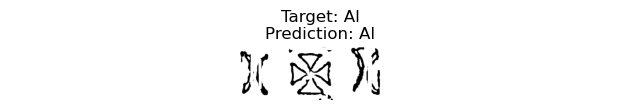

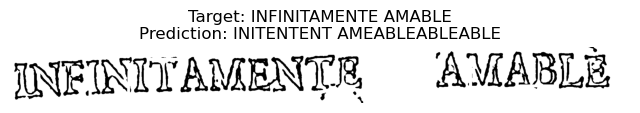

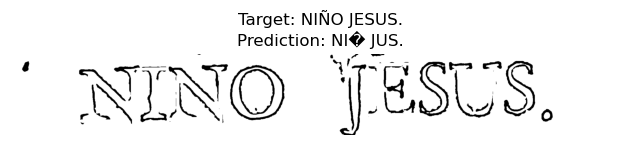

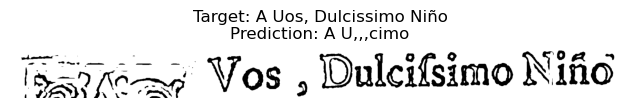

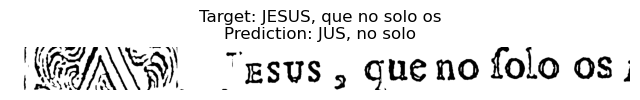

...

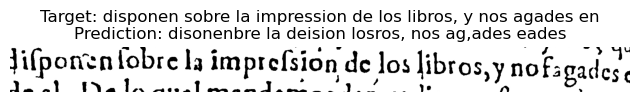

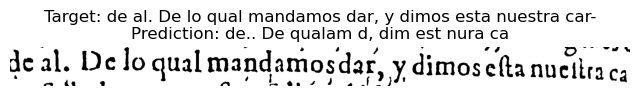

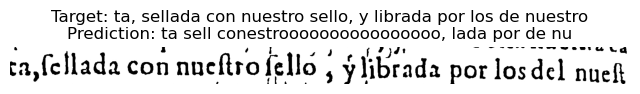

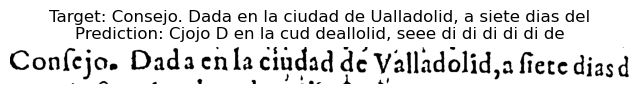

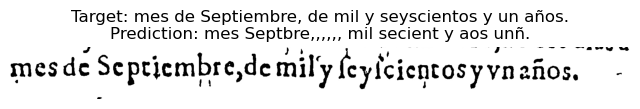

/home/sharvesh/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


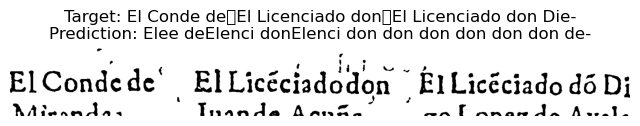

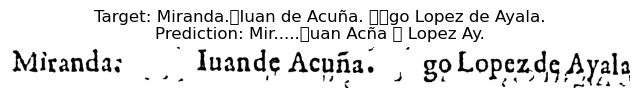

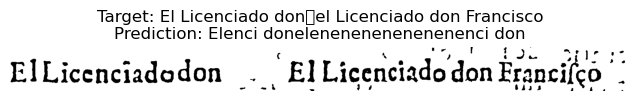

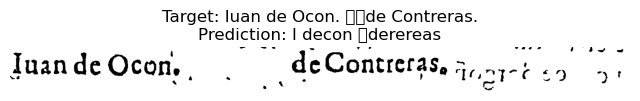

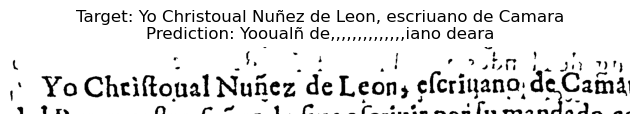

...

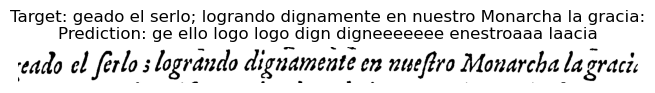

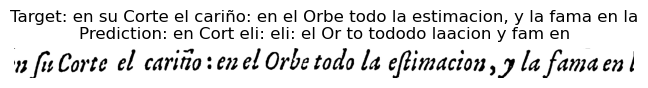

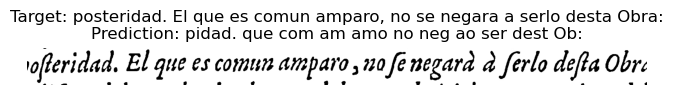

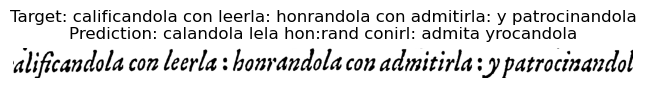

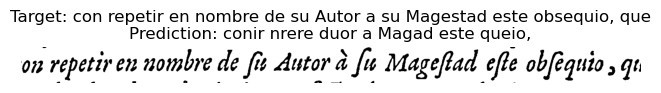

KeyboardInterrupt: 

In [17]:
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from jiwer import cer, wer
from PIL import Image
import numpy as np
import os

# Function to evaluate the trained model
def evaluate_model(line_images, texts, target_size=(256, 64), batch_size=2):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Define model and processor paths (update paths accordingly)
    model_path = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v3"
    processor_path = model_path
    
    processor = TrOCRProcessor.from_pretrained(processor_path)
    model = VisionEncoderDecoderModel.from_pretrained(model_path).to(device)
    model.eval()
    
    dataset = LineDataset(processor, model, line_images, texts, target_size, apply_augmentation=False)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
    
    cer_scores = []
    wer_scores = []
    predictions = []
    
    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            generated_ids = model.generate(pixel_values)
            generated_texts = processor.tokenizer.batch_decode(generated_ids, skip_special_tokens=True)
            
            for i, pred in enumerate(generated_texts):
                gt = texts[len(predictions)]  # Ground truth
                
                # Compute CER and WER
                cer_scores.append(cer(gt, pred))
                wer_scores.append(wer(gt, pred))
                
                predictions.append(pred)
                
                # Display image and predictions
                image_path = line_images[len(predictions) - 1]
                if isinstance(image_path, str):
                    image = Image.open(image_path).convert("L")
                else:
                    image = Image.fromarray(image_path).convert("L")
                
                plt.figure(figsize=(8, 6))
                plt.imshow(image, cmap='gray')
                plt.title(f"Target: {gt}\nPrediction: {pred}")
                plt.axis('off')
                plt.show()
                print("=" * 50)
    
    # Compute average scores
    avg_cer = sum(cer_scores) / len(cer_scores) if cer_scores else 0
    avg_wer = sum(wer_scores) / len(wer_scores) if wer_scores else 0
    
    print(f"Average CER: {avg_cer:.4f}")
    print(f"Average WER: {avg_wer:.4f}")
    print("Evaluation completed.")
    
    # Print all predictions
    for i, pred in enumerate(predictions):
        print(f"{i+1}: {pred}")

# Load your CSV file
csv_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"
df = pd.read_csv(csv_file)

line_images = df['image_path'].tolist()
texts = df['text'].tolist()

# Run evaluation
evaluate_model(line_images, texts, target_size=(256, 64), batch_size=2)

In [2]:
import pandas as pd
import albumentations as A
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import TrOCRProcessor, VisionEncoderDecoderModel, Trainer, TrainingArguments, GenerationConfig, EarlyStoppingCallback
from PIL import Image
import numpy as np
from torch.nn.utils.rnn import pad_sequence
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
import evaluate  # Updated for metrics
import os

# Load CER and WER metrics
cer_metric = evaluate.load("cer")
wer_metric = evaluate.load("wer")

# Define compute_metrics function
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    if isinstance(logits, tuple):
        logits = logits[0]
    predictions = logits.argmax(-1)
    decoded_preds = processor.tokenizer.batch_decode(predictions, skip_special_tokens=True)
    decoded_labels = []
    for label in labels:
        label_filtered = [token for token in label if token != -100]
        decoded_label = processor.tokenizer.decode(label_filtered, skip_special_tokens=True)
        decoded_labels.append(decoded_label)
    cer_score = cer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    wer_score = wer_metric.compute(predictions=decoded_preds, references=decoded_labels)
    return {"cer": cer_score, "wer": wer_score}

# Custom Dataset class (unchanged)
class LineDataset(Dataset):
    def __init__(self, processor, model, line_images, texts, target_size=(256, 64), max_length=512, apply_augmentation=True):
        self.line_images = line_images
        self.texts = texts
        self.processor = processor
        self.processor.image_processor.max_length = max_length
        self.processor.tokenizer.model_max_length = max_length
        self.model = model
        self.model.config.max_length = max_length
        self.target_size = target_size
        self.max_length = max_length
        self.apply_augmentation = apply_augmentation
        if apply_augmentation:
            self.transform = A.Compose([
                A.OneOf([
                    A.Rotate(limit=2, p=1.0),
                    A.GaussNoise(var_limit=(5.0, 10.0), p=1.0),
                    A.GaussianBlur(blur_limit=(3, 5), p=1.0),
                    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=1.0),
                    A.OpticalDistortion(distort_limit=0.02, shift_limit=0.02, p=1.0),
                ], p=0.8),
            ])
        else:
            self.transform = A.Compose([])
        print("Applied augmentation!")

    def __len__(self):
        return len(self.line_images)

    def __getitem__(self, idx):
        image = self.line_images[idx]
        text = self.texts[idx]
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")
        elif isinstance(image, np.ndarray):
            image = Image.fromarray(image).convert("RGB")
        image = np.array(image)
        if self.apply_augmentation:
            augmented = self.transform(image=image)
            image = augmented['image']
        image = Image.fromarray(image).resize(self.target_size, Image.BILINEAR)
        image = np.array(image) / 255.0
        image = np.transpose(image, (2, 0, 1))
        encoding = self.processor(images=image, text=text, return_tensors="pt")
        encoding['labels'] = encoding['labels'][:, :self.max_length]
        return {k: v.squeeze() for k, v in encoding.items()}

# Collate function
def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    labels = pad_sequence([item['labels'] for item in batch], batch_first=True, padding_value=-100)
    return {'pixel_values': pixel_values, 'labels': labels}

# Training function for the fine-tuned model
def continue_training_finetuned_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512, val_split=0.1):
    print("Inside continue training function!")
    device = torch.device("cpu")  # Adjust to "cuda" if GPU available

    # Load the fine-tuned model and processor
    global processor
    save_dir = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v3"
    processor = TrOCRProcessor.from_pretrained(save_dir, do_rescale=False)
    model = VisionEncoderDecoderModel.from_pretrained(save_dir).to(device)

    # Load or define generation config
    generation_config = GenerationConfig(max_length=512, no_repeat_ngram_size=3)

    # Create dataset (use same or new data)
    dataset = LineDataset(processor, model, line_images, texts, target_size, max_length, apply_augmentation=True)
    val_size = int(len(dataset) * val_split)
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    print(f"Training dataset size: {len(train_dataset)}")
    print(f"Validation dataset size: {len(val_dataset)}")

    # Define training arguments for continued training
    training_args = TrainingArguments(
        output_dir="/media/sharvesh/Expansion/Documents/model/results_continued_v3",  # New output dir
        num_train_epochs=5,  # Fewer epochs for additional training (adjust as needed)
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        logging_dir="./logs_continued_v2",
        logging_steps=20,  # More frequent logging
        save_steps=100,
        save_total_limit=2,
        evaluation_strategy="steps",
        eval_steps=20,
        learning_rate=1e-5,  # Lower learning rate for fine-tuning
        weight_decay=0.01,
        load_best_model_at_end=True,
        metric_for_best_model="cer",
        greater_is_better=False,
        gradient_accumulation_steps=16,
        fp16=False,  # Set to True if using GPU with CUDA
        use_cpu=True,  # Set to False if using GPU
        logging_first_step=True,
    )

    # Define optimizer and scheduler
    optimizer = AdamW(model.parameters(), lr=training_args.learning_rate, weight_decay=training_args.weight_decay)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2, verbose=True)

    # Initialize trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        data_collator=collate_fn,
        optimizers=(optimizer, scheduler),
        callbacks=[EarlyStoppingCallback(early_stopping_patience=5)],
        compute_metrics=compute_metrics
    )

    # Continue training
    trainer.train()

    # Save the updated fine-tuned model
    updated_save_dir = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v4"
    os.makedirs(updated_save_dir, exist_ok=True)
    model.save_pretrained(updated_save_dir)
    processor.save_pretrained(updated_save_dir)
    print(f"Updated model saved to {updated_save_dir}")

# Load your CSV file and prepare data
csv_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"
df = pd.read_csv(csv_file)

# Assuming columns 'image_path' and 'text' (updated from 'ground_truth')
line_images = df['image_path'].tolist()
texts = df['text'].tolist()

# Continue training the fine-tuned model
continue_training_finetuned_model(line_images, texts, target_size=(256, 64), batch_size=2, max_length=512)

/home/sharvesh/.local/lib/python3.12/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
2025-04-01 13:41:19.605132: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-01 13:41:19.701431: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743495079.739900    8454 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been re

Inside continue training function!


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.50, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.50.1"
}

Config of the decoder: <class 'transf

Applied augmentation!
Training dataset size: 528
Validation dataset size: 58


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/training_args.py:1611: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: sreesharvesh2709 (sreesharvesh2709-amrita-vishwa-vidyapeetham) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.


Step,Training Loss,Validation Loss,Cer,Wer
20,0.056600,0.060328,0.006397,0.021073
40,0.051600,0.064336,0.008884,0.030651
60,0.048300,0.051742,0.010661,0.022989
80,0.054900,0.072586,0.010661,0.026820


/home/sharvesh/.local/lib/python3.12/site-packages/transformers/modeling_utils.py:3353: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 512}. You are seeing this warning because you've set generation parameters in the model config, as opposed to in the generation config.
  warnings.warn(


Updated model saved to /media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v4


In [ ]:
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from jiwer import cer, wer
from PIL import Image
import numpy as np
import os

# Function to evaluate the trained model
def evaluate_model(line_images, texts, target_size=(256, 64), batch_size=2):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Define model and processor paths (update paths accordingly)
    model_path = "/media/sharvesh/Expansion/Documents/model/finetuned_trocr_spanish_historical_v4"
    processor_path = model_path
    
    processor = TrOCRProcessor.from_pretrained(processor_path)
    model = VisionEncoderDecoderModel.from_pretrained(model_path).to(device)
    model.eval()
    
    dataset = LineDataset(processor, model, line_images, texts, target_size, apply_augmentation=False)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
    
    cer_scores = []
    wer_scores = []
    predictions = []
    
    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            generated_ids = model.generate(pixel_values)
            generated_texts = processor.tokenizer.batch_decode(generated_ids, skip_special_tokens=True)
            
            for i, pred in enumerate(generated_texts):
                gt = texts[len(predictions)]  # Ground truth
                
                # Compute CER and WER
                cer_scores.append(cer(gt, pred))
                wer_scores.append(wer(gt, pred))
                
                predictions.append(pred)
                
                # Display image and predictions
                image_path = line_images[len(predictions) - 1]
                if isinstance(image_path, str):
                    image = Image.open(image_path).convert("L")
                else:
                    image = Image.fromarray(image_path).convert("L")
                
                plt.figure(figsize=(8, 6))
                plt.imshow(image, cmap='gray')
                plt.title(f"Target: {gt}\nPrediction: {pred}")
                plt.axis('off')
                plt.show()
                print("=" * 50)
    
    # Compute average scores
    avg_cer = sum(cer_scores) / len(cer_scores) if cer_scores else 0
    avg_wer = sum(wer_scores) / len(wer_scores) if wer_scores else 0
    
    print(f"Average CER: {avg_cer:.4f}")
    print(f"Average WER: {avg_wer:.4f}")
    print("Evaluation completed.")
    
    # Print all predictions
    for i, pred in enumerate(predictions):
        print(f"{i+1}: {pred}")

# Load your CSV file
csv_file = "/home/sharvesh/Documents/Others/Human_AI/Model/data/output/dataset.csv"
df = pd.read_csv(csv_file)

line_images = df['image_path'].tolist()
texts = df['text'].tolist()

# Run evaluation
evaluate_model(line_images, texts, target_size=(256, 64), batch_size=2)